# 04 · 송도 시간 구조 측정과 분석 공간 자동 등록표

이 노트북은 [12. 사건 구성과 지표 계산의 결정안](../진행작업%20순서/12_사건구성과지표계산_결정안.md)의 첫 단계입니다. 차량쌍·사건·TTC/PET를 만들기 전에 그 계산이 기대는 **자료의 성질을 측정**하고, 05가 사용할 **분석 공간 등록표를 자동으로** 만듭니다.

1. **시간·드론 구조 측정** — 차량별 연속 관측 간격, 드론별 시각열 간격, 한 파일의 드론 수·시간 겹침, 중복 시각 행(12 결정 ②).
2. **좌표계 방향 확인** — `Local_X/Y` 축 방향은 원문 not_found입니다. 영상 좌표(Ortho)와의 선형 관계로 파일마다 측정해 좌·우회전 부호를 바로잡습니다(12 결정 ①).
3. **차량별 이동 요약** — 교차로 중앙(무라벨)을 **바로 앞·뒤에 둔 구역**을 진입·진출 구역으로 보고, 두 구역 안의 위치 변화로 방향 변화를 계산합니다.
4. **자동 등록표와 확인용 지도** — 구역쌍의 이동(가장 가까운 기준각: 직진 0°, 좌회전 +90°, 우회전 −90°, 유턴 180°), 구역 역할(접근로·진출로), 차로 역할(그 차로를 지난 차량의 최다 이동)을 **자동 잠정 라벨**로 만들고 05가 그대로 사용합니다.

**사용자 결정(2026-09-23):** 분석을 끝까지 빠르게 진행하기 위해 등록표 확정을 멈춤 단계로 두지 않습니다. 자동 잠정 라벨로 05·06을 진행하고, 사용자 확인(`confirmed_...` 칸, 지도)은 결과를 본 뒤의 점검·감도분석으로 합니다.

하지 않는 일: 차량쌍·사건, TTC/PET, EVT, 번호만으로 방향 판정, 교차로 중앙 제외, 공백 보간, 초 단위 기준. **출력되는 수는 상충 건수가 아닙니다.**

- 대상: 20개 지점 × 4일 × 10세션 = 전체 800개 CSV. 원자료는 읽기 전용입니다.
- 입력 실행 고정: 01 `20260916T063821Z_28f9e8ee`(입력 목록), 03 `20260916T134547Z_047caf90`(지도 다각형).
- 결과: `data/processed/songdo_structure/<새 실행 ID>/`. 사용자가 위에서 아래로 실행하고 저장합니다.

| 코드 셀 | 하는 일 | 확인할 점 |
|---|---|---|
| 1–3 | 패키지·경로·입력 실행 확인 | 800개 입력과 01·03 완료 상태 |
| 4 | 파일 하나를 측정·요약하는 함수 | 아직 원자료를 읽지 않음 |
| 5 | 이번 실행 폴더 만들기 | 새 실행 ID |
| **6** | **전체 800개 파일 처리** | 가장 오래 걸리는 셀. 파일 기준 진행률·오류 |
| 7 | 시간·드론 구조 결과 | 관측 간격·드론 겹침·중복 시각 분포 |
| 8 | 좌표계 방향 결과 | 모든 파일의 방향이 같은지 |
| 9 | 자동 등록표 저장 | 구역쌍 이동·구역 역할·차로 역할·구역 연결 |
| 10 | 확인용 지도 20장 | 화살표 색은 자동 잠정 라벨 |
| 11 | 다음 단계로 넘길 요약 | 05 입력 실행 ID |

## 1. 준비
01~03과 같은 패키지를 사용합니다. 설치되지 않은 경우 셀이 필요한 이름을 알려주며 자동 설치는 하지 않습니다.

In [1]:
from pathlib import Path
from datetime import datetime, timezone
import hashlib
import importlib.util
import io
import json
import math
import time
import uuid

packages = {"pandas": "pandas", "numpy": "numpy", "PIL": "Pillow", "IPython": "IPython"}
missing = [p for m, p in packages.items() if importlib.util.find_spec(m) is None]
if missing:
    raise ImportError("별도 셀에서 설치하세요: %pip install " + " ".join(missing))
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
print("준비 완료 | pandas", pd.__version__, "| numpy", np.__version__)

준비 완료 | pandas 3.0.5 | numpy 2.4.6


## 2. 입력 실행·경로·상수 고정
- 01의 입력 목록(파일 크기·수정 시각)으로 원자료가 바뀌지 않았는지 확인합니다. 03의 `map_index.csv`는 확인용 지도의 차로 다각형에만 씁니다.
- `FPS = 29.97`은 송도 원자료의 촬영 프레임률입니다(Fonod p.19). 관측 간격을 **프레임 단위로 표현**하는 데만 씁니다.
- `GAP_EDGES_FRAMES`는 분포를 **보고하기 위한 칸**이며 판정 기준이 아닙니다.

In [2]:
PROJECT = next((p for p in [Path.cwd().resolve(), *Path.cwd().resolve().parents]
                if (p / "AGENTS.md").is_file() and (p / "data/raw").is_dir()), None)
if PROJECT is None:
    raise FileNotFoundError("프로젝트 또는 analysis 폴더에서 실행하세요.")
RAW = (PROJECT / "data/raw").resolve()
SOURCE01_ID = "20260916T063821Z_28f9e8ee"
SOURCE03_ID = "20260916T134547Z_047caf90"
SOURCE01 = (PROJECT / "data/processed/songdo_movement" / SOURCE01_ID).resolve()
SOURCE03 = (PROJECT / "data/processed/songdo_route_geometry" / SOURCE03_ID).resolve()
OUTPUT_ROOT = (PROJECT / "data/processed/songdo_structure").resolve()
if (not OUTPUT_ROOT.is_relative_to(PROJECT)
        or any(OUTPUT_ROOT.is_relative_to(p) for p in [RAW, SOURCE01, SOURCE03])):
    raise ValueError("출력 경로가 입력과 겹칩니다.")

SITES = list("ABCEFGHIJKLMNOPQRSTU")
DATES = [f"2022-10-{d:02d}" for d in range(4, 8)]
SESSIONS = [f"{p}{i}" for p in ["AM", "PM"] for i in range(1, 6)]
EXPECTED = {f"{d}_{s}_{t}": (d, s, t) for d in DATES for s in SITES for t in SESSIONS}
PROVENANCE_KEYS = ["source_file", "file_stem", "date", "site", "session"]
READ_COLUMNS = ["Vehicle_ID", "Local_Time", "Drone_ID", "Ortho_X", "Ortho_Y",
                "Local_X", "Local_Y", "Road_Section", "Lane_Number"]
STRING_COLUMNS = {c: "string" for c in
                  ["Vehicle_ID", "Local_Time", "Drone_ID", "Road_Section", "Lane_Number"]}
CLOCK_RE = r"(?:[01]\d|2[0-3]):[0-5]\d:[0-5]\d(?:\.\d{1,9})?"
UNLABELED = "<unlabeled>"
FPS = 29.97
FRAME_S = 1.0 / FPS
GAP_EDGES_FRAMES = [0.0, 0.5, 1.5, 2.5, 5.5, 30.5, 299.5, np.inf]
GAP_LABELS = ["lt0.5f", "1f", "2f", "3to5f", "6to30f", "31to299f", "ge300f"]
CANONICAL = {"직진": 0.0, "좌회전": 90.0, "우회전": -90.0, "유턴": 180.0}
CORNERS = [("tlx", "tly"), ("blx", "bly"), ("brx", "bry"), ("trx", "try")]
print("입력 01:", SOURCE01_ID, "| 입력 03:", SOURCE03_ID, "| 전체:", len(EXPECTED), "개 파일")
print("결과 상위 폴더:", OUTPUT_ROOT)

입력 01: 20260916T063821Z_28f9e8ee | 입력 03: 20260916T134547Z_047caf90 | 전체: 800 개 파일
결과 상위 폴더: C:\Users\123\Documents\(송도) 교통 연구 논문\data\processed\songdo_structure


## 3. 입력 확인과 안전한 저장 함수
01·03 실행이 완료된 전체 800개 실행인지 확인하고, 원자료 800개의 크기·수정 시각이 01 입력 목록과 같은지 대조합니다. 저장은 이번 실행 폴더 안에서만 하며 임시 파일에 쓴 뒤 교체합니다.

In [3]:
def now_utc():
    return datetime.now(timezone.utc).isoformat()


def signature(path):
    stat = Path(path).stat()
    return {"size_bytes": str(stat.st_size), "mtime_ns": str(stat.st_mtime_ns)}


def assert_signature(path, expected):
    if signature(path) != {k: str(expected[k]) for k in ["size_bytes", "mtime_ns"]}:
        raise RuntimeError("입력 파일 크기 또는 수정 시각 변경: " + str(path))


def stable_bytes(path):
    before = signature(path)
    content = Path(path).read_bytes()
    if signature(path) != before:
        raise RuntimeError("읽는 중 파일이 바뀌었습니다: " + str(path))
    return content, {**before, "sha256": hashlib.sha256(content).hexdigest()}


def source_path(relative, base):
    path = (PROJECT / str(relative)).resolve()
    if not path.is_relative_to(base.resolve()) or not path.is_file():
        raise ValueError("허용된 입력 파일이 아닙니다: " + str(path))
    return path


def target_path(path):
    path = Path(path).resolve()
    if (not path.is_relative_to(RUN_DIR.resolve())
            or any(path.is_relative_to(p) for p in [RAW, SOURCE01, SOURCE03])):
        raise ValueError("이번 실행 폴더 밖에는 저장하지 않습니다.")
    return path


def save_csv(table, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    table.to_csv(temporary, index=False, encoding="utf-8-sig")
    temporary.replace(target)


def save_json(value, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    temporary.write_text(json.dumps(value, ensure_ascii=False, indent=2), encoding="utf-8")
    temporary.replace(target)


def save_image(image, path):
    target = target_path(path)
    temporary = target.with_name(target.name + ".tmp")
    image.save(temporary, format="PNG")
    temporary.replace(target)


controls = {}
def read_control(base, name, **kwargs):
    path = base / name
    content, fingerprint = stable_bytes(path)
    controls[path.relative_to(PROJECT).as_posix()] = fingerprint
    if name.endswith(".json"):
        return json.loads(content.decode("utf-8-sig"))
    return pd.read_csv(io.BytesIO(content), keep_default_na=False, **kwargs)


meta01 = read_control(SOURCE01, "run_metadata.json")
if not (meta01.get("run_id") == SOURCE01_ID and meta01.get("status") == "completed"
        and meta01.get("completed_files") == 800 and meta01.get("failed_files") == 0):
    raise ValueError("01이 완료된 전체 800개 실행이 아닙니다.")
manifest = read_control(SOURCE01, "input_manifest.csv",
                        dtype={"size_bytes": "string", "mtime_ns": "string"})
if (len(manifest) != 800 or manifest["file_stem"].duplicated().any()
        or set(manifest["file_stem"]) != set(EXPECTED)):
    raise ValueError("01 입력 목록이 20지점×4일×10세션 800개와 다릅니다.")
for item in manifest.to_dict("records"):
    d, s, t = EXPECTED[item["file_stem"]]
    if ((item["date"], item["site"], item["session"]) != (d, s, t)
            or item["source_file"] != f"data/raw/{d}_{s}/{item['file_stem']}.csv"):
        raise ValueError("입력 목록의 날짜·지점·세션·경로 불일치: " + item["file_stem"])
    assert_signature(source_path(item["source_file"], RAW), item)
progress01 = read_control(SOURCE01, "progress.csv")
expected_rows = dict(zip(progress01["file_stem"], pd.to_numeric(progress01["n_source_rows"])))

meta03 = read_control(SOURCE03, "run_metadata.json")
if not (meta03.get("run_id") == SOURCE03_ID and meta03.get("status") == "completed"
        and meta03.get("source01_run_id") == SOURCE01_ID):
    raise ValueError("03이 완료된 실행이 아니거나 01 출처가 다릅니다.")
map_index = read_control(SOURCE03, "map_index.csv", dtype={"Section": "string", "Lane": "string"})
if set(map_index["site"]) != set(SITES):
    raise ValueError("03 지도 인덱스의 지점 구성이 다릅니다.")
print("입력 확인 완료: 원자료 800개 크기·수정 시각 일치 | 지도 다각형", len(map_index), "개")

입력 확인 완료: 원자료 800개 크기·수정 시각 일치 | 지도 다각형 1339 개


## 4. 파일 하나를 측정·요약하는 함수
이 셀은 함수만 정의합니다. 실제 처리는 6번 코드 셀에서 시작합니다.

**시간·드론 구조(`time_structure`)**
- 드론별로 그 드론이 기록한 **서로 다른 시각의 목록**을 만들고, 이웃한 시각 사이 간격을 프레임 단위로 셉니다.
- 차량마다 연속한 두 관측 사이 간격을 셉니다. 1프레임(다음 프레임)보다 크면 그 사이 관측이 빠진 것입니다. 05는 **한 프레임이라도 빠지면 연속 관측이 끊긴 것**으로 보고 보간하지 않습니다(11 §6). 이 분포는 그 선택이 사건을 얼마나 쪼개는지 보여줍니다.
- 한 파일의 드론 수, 드론끼리의 시간 겹침, 여러 드론에 기록된 차량 수를 셉니다. 드론 간 시계는 미확인이므로 05의 차량쌍은 같은 드론 안에서만 만듭니다(12 결정 ②).
- 같은 차량·같은 시각의 중복 행은 평균 내거나 첫 행을 고르지 않고 계산에서 빼며 수만 셉니다.

**좌표계 방향(`handedness`)**
- 파일의 유효 관측으로 `Local = A·Ortho + b`를 최소제곱으로 맞춥니다. 영상 좌표는 x가 오른쪽·y가 아래쪽이므로, `det(A) < 0`이면 Local은 보통 지도 방향(오른손계), `det(A) > 0`이면 축이 바뀐 왼손계입니다. 왼손계면 방향 변화 부호를 뒤집어 좌회전이 +가 되게 합니다. 잔차(m)가 작아야 믿을 만합니다.

**차량별 이동 요약(`movement_summary`)**
- 시간순 관측을 **같은 구역 라벨이 이어진 묶음**으로 나눕니다(무라벨도 하나의 묶음, 02와 같은 방식).
- 첫 라벨 묶음과 마지막 라벨 묶음 **사이의 무라벨 묶음**을 교차로 중앙 통과로 봅니다. 그 **바로 앞 라벨 묶음 = 진입 구역**, **바로 뒤 라벨 묶음 = 진출 구역**, 진입 묶음의 마지막 차로 = 진입 차로입니다.
- 진입·진출 묶음 안의 처음→끝 위치 변화로 진행 방향을 구하고 그 차이를 방향 변화로 씁니다. 중앙 통과가 관측되지 않은 차량에는 이동 라벨을 붙이지 않습니다.
- 중앙 앞(pre)·뒤(post)에서 지난 구역·차로 사용 기록을 남깁니다. 9번에서 구역 역할과 차로 역할을 정하는 근거입니다.

In [4]:
def histogram_frames(values_s, prefix):
    frames = np.asarray(values_s, dtype=float) / FRAME_S
    counts, _ = np.histogram(frames, bins=GAP_EDGES_FRAMES)
    return {f"{prefix}{label}": int(c) for label, c in zip(GAP_LABELS, counts)}


def nearest_canonical(angles_deg):
    angles = np.asarray(angles_deg, dtype=float)
    names = np.array(list(CANONICAL), dtype=object)
    refs = np.array(list(CANONICAL.values()), dtype=float)
    diff = np.abs((angles[:, None] - refs[None, :] + 180.0) % 360.0 - 180.0)
    safe = np.where(np.isfinite(diff), diff, np.inf)
    index = np.argmin(safe, axis=1)
    suggestion = names[index].astype(object)
    residual = diff[np.arange(len(angles)), index]
    suggestion[~np.isfinite(angles)] = ""
    residual[~np.isfinite(angles)] = np.nan
    return suggestion, residual


def read_file(item):
    raw_path = source_path(item["source_file"], RAW)
    assert_signature(raw_path, item)
    frame = pd.read_csv(raw_path, usecols=READ_COLUMNS, dtype=STRING_COLUMNS,
                        keep_default_na=False, na_values=[""], low_memory=False)
    assert_signature(raw_path, item)
    return prepare_frame(frame)


def prepare_frame(frame):
    frame["_source_row"] = np.arange(1, len(frame) + 1, dtype=np.int64)
    valid_id = frame["Vehicle_ID"].str.fullmatch(r"[1-9]\d*", na=False).to_numpy(dtype=bool)
    valid_clock = frame["Local_Time"].str.fullmatch(CLOCK_RE, na=False).to_numpy(dtype=bool)
    frame["_t"] = pd.to_timedelta(frame["Local_Time"].where(valid_clock),
                                  errors="coerce").dt.total_seconds().to_numpy(dtype=float)
    for name in ["Local_X", "Local_Y", "Ortho_X", "Ortho_Y"]:
        frame["_" + name] = pd.to_numeric(frame[name], errors="coerce").astype("float64")
    frame["_valid"] = (valid_id & valid_clock & np.isfinite(frame["_t"].to_numpy())
                       & np.isfinite(frame["_Local_X"].to_numpy())
                       & np.isfinite(frame["_Local_Y"].to_numpy()))
    frame["_vid"] = frame["Vehicle_ID"].fillna("").astype(str)
    frame["_drone"] = frame["Drone_ID"].fillna("").astype(str)
    section = frame["Road_Section"].fillna("").astype(str).str.strip()
    lane = frame["Lane_Number"].fillna("").astype(str).str.strip()
    frame["_section"] = np.where(section.eq(""), UNLABELED, section)
    frame["_lane"] = np.where(lane.eq(""), UNLABELED, lane)
    duplicated = frame.duplicated(["_vid", "_t"], keep=False).to_numpy(dtype=bool)
    frame["_dup"] = duplicated & frame["_valid"].to_numpy(dtype=bool)
    return frame


def time_structure(frame, item):
    valid = frame.loc[frame["_valid"]]
    provenance = {k: item[k] for k in PROVENANCE_KEYS}
    drone_rows, spans = [], {}
    for drone, group in valid.groupby("_drone", sort=True):
        times = np.unique(group["_t"].to_numpy(dtype=float))
        steps = np.diff(times)
        spans[drone] = (float(times[0]), float(times[-1]))
        drone_rows.append({**provenance, "drone_id": drone,
                           "n_rows": int(len(group)), "n_vehicles": int(group["_vid"].nunique()),
                           "n_unique_times": int(len(times)),
                           "first_time_s": float(times[0]), "last_time_s": float(times[-1]),
                           "span_s": float(times[-1] - times[0]),
                           "max_time_step_s": float(steps.max()) if len(steps) else 0.0,
                           "n_duplicate_time_rows": int(group["_dup"].sum()),
                           **histogram_frames(steps, "grid_")})
    overlap_rows = []
    drones = sorted(spans)
    for i in range(len(drones)):
        for j in range(i + 1, len(drones)):
            a, b = spans[drones[i]], spans[drones[j]]
            overlap_rows.append({**provenance, "drone_a": drones[i], "drone_b": drones[j],
                                 "overlap_s": float(max(0.0, min(a[1], b[1]) - max(a[0], b[0])))})
    clean = valid.loc[~valid["_dup"]].sort_values(["_vid", "_t", "_source_row"], kind="stable")
    ids = clean["_vid"].to_numpy()
    same_vehicle = ids[1:] == ids[:-1]
    vehicle_steps = np.diff(clean["_t"].to_numpy(dtype=float))[same_vehicle]
    drones_per_vehicle = valid.groupby("_vid")["_drone"].nunique()
    row = {"n_source_rows": int(len(frame)), "n_valid_rows": int(frame["_valid"].sum()),
           "n_invalid_rows": int((~frame["_valid"]).sum()),
           "n_vehicles": int(valid["_vid"].nunique()), "n_drones": len(drones),
           "drone_ids_json": json.dumps(drones, ensure_ascii=False),
           "max_drone_overlap_s": max([r["overlap_s"] for r in overlap_rows], default=0.0),
           "n_vehicles_multi_drone": int((drones_per_vehicle > 1).sum()),
           "n_duplicate_time_rows": int(valid["_dup"].sum()),
           "n_vehicle_steps": int(len(vehicle_steps)),
           "vehicle_step_median_ms": float(np.median(vehicle_steps) * 1000) if len(vehicle_steps) else np.nan,
           **histogram_frames(vehicle_steps, "step_")}
    return row, drone_rows, overlap_rows


def handedness(frame):
    usable = (frame["_valid"] & ~frame["_dup"] & np.isfinite(frame["_Ortho_X"])
              & np.isfinite(frame["_Ortho_Y"]))
    ortho = frame.loc[usable, ["_Ortho_X", "_Ortho_Y"]].to_numpy(dtype=float)
    local = frame.loc[usable, ["_Local_X", "_Local_Y"]].to_numpy(dtype=float)
    result = {"n_fit_rows": int(len(ortho))}
    if len(ortho) < 3:
        return {**result, "a11": np.nan, "a12": np.nan, "a21": np.nan, "a22": np.nan,
                "b1": np.nan, "b2": np.nan, "det": np.nan, "m_per_px": np.nan,
                "rms_residual_m": np.nan, "local_frame": "not_enough_rows", "turn_sign": np.nan}
    design = np.column_stack([ortho, np.ones(len(ortho))])
    coef, *_ = np.linalg.lstsq(design, local, rcond=None)
    matrix = coef[:2, :].T
    det = float(np.linalg.det(matrix))
    residual = local - design @ coef
    frame_type = "right_handed" if det < 0 else ("left_handed" if det > 0 else "degenerate")
    turn_sign = 1.0 if det < 0 else (-1.0 if det > 0 else np.nan)
    return {**result, "a11": float(matrix[0, 0]), "a12": float(matrix[0, 1]),
            "a21": float(matrix[1, 0]), "a22": float(matrix[1, 1]),
            "b1": float(coef[2, 0]), "b2": float(coef[2, 1]), "det": det,
            "m_per_px": float(math.sqrt(abs(det))),
            "rms_residual_m": float(np.sqrt(np.mean(np.sum(residual ** 2, axis=1)))),
            "local_frame": frame_type, "turn_sign": turn_sign}


def movement_summary(frame, item, turn_sign):
    usable = frame["_valid"] & ~frame["_dup"]
    work = frame.loc[usable, ["_vid", "_drone", "_t", "_source_row", "_Local_X", "_Local_Y",
                              "_Ortho_X", "_Ortho_Y", "_section", "_lane"]].sort_values(
        ["_vid", "_t", "_source_row"], kind="stable")
    ids = work["_vid"].to_numpy()
    sections = work["_section"].to_numpy()
    new_block = np.ones(len(work), dtype=bool)
    if len(work) > 1:
        new_block[1:] = (ids[1:] != ids[:-1]) | (sections[1:] != sections[:-1])
    work["_block"] = np.cumsum(new_block)
    blocks = work.groupby("_block", sort=True).agg(
        vid=("_vid", "first"), section=("_section", "first"), drone=("_drone", "first"),
        t_first=("_t", "first"), t_last=("_t", "last"),
        x_first=("_Local_X", "first"), y_first=("_Local_Y", "first"),
        x_last=("_Local_X", "last"), y_last=("_Local_Y", "last"),
        ox_first=("_Ortho_X", "first"), oy_first=("_Ortho_Y", "first"),
        ox_last=("_Ortho_X", "last"), oy_last=("_Ortho_Y", "last"),
        lane_last=("_lane", "last"), n_rows=("_t", "size"),
    ).reset_index(drop=True)
    blocks["order"] = blocks.groupby("vid", sort=False).cumcount()
    blocks["labeled"] = blocks["section"].ne(UNLABELED)
    dx = blocks["x_last"] - blocks["x_first"]
    dy = blocks["y_last"] - blocks["y_first"]
    blocks["heading_deg"] = np.where((dx == 0) & (dy == 0), np.nan, np.degrees(np.arctan2(dy, dx)))

    labeled_orders = blocks.loc[blocks["labeled"]].groupby("vid")["order"].agg(lab_min="min", lab_max="max")
    unlabeled = blocks.loc[~blocks["labeled"], ["vid", "order"]].join(labeled_orders, on="vid", how="inner")
    unlabeled = unlabeled.loc[(unlabeled["order"] > unlabeled["lab_min"])
                              & (unlabeled["order"] < unlabeled["lab_max"])]
    center = unlabeled.groupby("vid")["order"].agg(center_first="min", center_last="max")

    vehicles = blocks.groupby("vid", sort=True).agg(
        n_blocks=("order", "size"), n_labeled_blocks=("labeled", "sum"),
        first_time_s=("t_first", "min"), last_time_s=("t_last", "max"),
        n_rows=("n_rows", "sum"), n_drones=("drone", "nunique"))
    vehicles = vehicles.join(center)
    labeled = blocks.loc[blocks["labeled"]].join(center, on="vid", how="inner")
    entry = labeled.loc[labeled["order"] < labeled["center_first"]].groupby("vid", sort=False).tail(1).set_index("vid")
    exit_ = labeled.loc[labeled["order"] > labeled["center_last"]].groupby("vid", sort=False).head(1).set_index("vid")
    vehicles = vehicles.join(entry[["section", "heading_deg", "lane_last", "drone",
                                    "ox_last", "oy_last"]].rename(columns={
        "section": "entry_section", "heading_deg": "entry_heading_deg", "lane_last": "entry_lane",
        "drone": "entry_drone", "ox_last": "entry_ortho_x", "oy_last": "entry_ortho_y"}))
    vehicles = vehicles.join(exit_[["section", "heading_deg", "drone",
                                    "ox_first", "oy_first"]].rename(columns={
        "section": "exit_section", "heading_deg": "exit_heading_deg",
        "drone": "exit_drone", "ox_first": "exit_ortho_x", "oy_first": "exit_ortho_y"}))
    change = (vehicles["exit_heading_deg"] - vehicles["entry_heading_deg"] + 180.0) % 360.0 - 180.0
    vehicles["heading_change_deg"] = change * turn_sign
    vehicles["movement_status"] = np.select(
        [vehicles["n_labeled_blocks"].eq(0),
         vehicles["center_first"].isna(),
         vehicles["entry_section"].eq(vehicles["exit_section"]),
         vehicles["heading_change_deg"].isna()],
        ["no_labeled_section", "no_center_passage", "same_entry_exit_section", "direction_not_computable"],
        default="entry_exit_pair")
    suggestion, residual = nearest_canonical(vehicles["heading_change_deg"].to_numpy(dtype=float))
    is_pair = vehicles["movement_status"].eq("entry_exit_pair").to_numpy()
    vehicles["suggested_movement"] = np.where(is_pair, suggestion, "")
    vehicles["angle_from_suggestion_deg"] = np.where(is_pair, residual, np.nan)
    vehicles = vehicles.reset_index().rename(columns={"vid": "Vehicle_ID"})
    vehicles.insert(0, "actor_id", item["source_file"] + "::" + vehicles["Vehicle_ID"])
    for key in reversed(PROVENANCE_KEYS):
        vehicles.insert(0, key, item[key])

    work["_order"] = blocks["order"].to_numpy()[work["_block"].to_numpy() - 1]
    used = work.loc[work["_section"].ne(UNLABELED), ["_vid", "_section", "_lane", "_order"]].join(
        center, on="_vid", how="inner")
    phase = np.where(used["_order"] < used["center_first"], "pre",
                     np.where(used["_order"] > used["center_last"], "post", ""))
    usage = (used.assign(phase=phase).loc[lambda d: d["phase"].ne("")]
             .drop_duplicates(["_vid", "_section", "_lane", "phase"])
             [["_vid", "_section", "_lane", "phase"]]
             .rename(columns={"_vid": "Vehicle_ID", "_section": "section", "_lane": "lane"}))
    for key in reversed(PROVENANCE_KEYS):
        usage.insert(0, key, item[key])

    steps = blocks[["vid", "section", "labeled"]].copy()
    steps["next_section"] = steps.groupby("vid", sort=False)["section"].shift(-1)
    steps["next_labeled"] = steps.groupby("vid", sort=False)["labeled"].shift(-1)
    direct = steps.loc[steps["labeled"] & steps["next_labeled"].eq(True)]
    links = direct.groupby(["section", "next_section"], sort=True).size().reset_index(name="n_transitions")
    links = links.rename(columns={"section": "from_section", "next_section": "to_section"})
    for key in reversed(PROVENANCE_KEYS):
        links.insert(0, key, item[key])
    n_valid_vehicles = int(frame.loc[frame["_valid"], "_vid"].nunique())
    counts = {"n_vehicles_summarized": int(len(vehicles)),
              "n_vehicles_only_duplicate_rows": n_valid_vehicles - int(len(vehicles)),
              **{f"n_status_{k}": int(v) for k, v in vehicles["movement_status"].value_counts().items()}}
    return vehicles, usage, links, counts

print("측정·요약 함수 정의 완료. 아직 원자료를 읽지 않았습니다.")

측정·요약 함수 정의 완료. 아직 원자료를 읽지 않았습니다.


## 5. 이번 실행 폴더 만들기
매번 새 폴더를 만듭니다. 6번을 다시 시작하려면 이 셀부터 새 실행을 만드세요. 이전 결과를 이어 쓰거나 덮어쓰지 않습니다.

In [5]:
RUN_ID = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ") + "_" + uuid.uuid4().hex[:8]
RUN_DIR = (OUTPUT_ROOT / RUN_ID).resolve()
if not RUN_DIR.is_relative_to(OUTPUT_ROOT) or any(RUN_DIR.is_relative_to(p) for p in [RAW, SOURCE01, SOURCE03]):
    raise ValueError("출력 폴더 경로 오류")
RUN_DIR.mkdir(parents=True, exist_ok=False)
for folder in ["time", "vehicles", "usage", "links", "registry", "maps"]:
    (RUN_DIR / folder).mkdir()
run_metadata = {
    "run_id": RUN_ID, "source01_run_id": SOURCE01_ID, "source03_run_id": SOURCE03_ID,
    "decision_record": "진행작업 순서/12_사건구성과지표계산_결정안.md",
    "started_at_utc": now_utc(), "finished_at_utc": None, "status": "ready",
    "expected_files": 800, "attempted_files": 0, "completed_files": 0, "failed_files": 0,
    "read_columns": READ_COLUMNS, "source_control_fingerprints": controls,
    "original_files_are_read_only": True, "fps_for_frame_units": FPS,
    "gap_bins_are_reporting_only": True,
    "handedness_rule": "fit Local = A*Ortho + b; det(A)<0 -> right-handed local frame (turn_sign +1)",
    "entry_exit_rule": "labeled block right before / right after the unlabeled center blocks between first and last labeled blocks",
    "movement_label": "nearest of 직진 0, 좌회전 +90, 우회전 -90, 유턴 180 degrees; automatic provisional",
    "section_role_rule": "approach if vehicles using it before the center >= after the center",
    "lane_role_rule": "through_or_shared if the plurality movement of vehicles using the lane before the center is 직진",
    "user_confirmation": "post-hoc check and sensitivity (user decision 2026-09-23)",
    "pairs_events_ttc_pet_evt": "not_performed",
}
save_json(run_metadata, RUN_DIR / "run_metadata.json")
progress_rows = []
print("이번 결과 폴더:", RUN_DIR)

이번 결과 폴더: C:\Users\123\Documents\(송도) 교통 연구 논문\data\processed\songdo_structure\20260922T182837Z_4eaba3c7


## 6. 전체 800개 파일 처리
**실제 원자료를 읽는 셀입니다.** 파일마다 한 번 읽어 시간·드론 구조, 좌표계 방향, 차량별 이동 요약을 저장합니다.

- 파일 오류는 기록하고 나머지를 계속 처리합니다. 오류가 있으면 전체 완료로 표시하지 않습니다.
- 중단하면 `interrupted`로 표시되고 완료된 파일 결과는 남습니다. 다시 하려면 5번부터 새 실행을 만듭니다.
- 원자료 크기·수정 시각이 입력 목록과 다르거나 행 수가 01과 다르면 그 파일은 오류로 기록합니다.

In [6]:
if run_metadata["status"] != "ready":
    raise RuntimeError("이미 시작한 실행입니다. 다시 시작하려면 5번에서 새 실행을 만드세요.")
run_metadata["status"] = "running"
save_json(run_metadata, RUN_DIR / "run_metadata.json")
started = time.perf_counter()
try:
    for index, item in enumerate(manifest.sort_values("file_stem").to_dict("records"), start=1):
        record = {key: item[key] for key in PROVENANCE_KEYS}
        file_started = time.perf_counter()
        frame = None
        try:
            frame = read_file(item)
            if len(frame) != int(expected_rows[item["file_stem"]]):
                raise ValueError("원자료 행 수가 01 기록과 다릅니다.")
            time_row, drone_rows, overlap_rows = time_structure(frame, item)
            hand = handedness(frame)
            vehicles, usage, links, counts = movement_summary(frame, item, hand["turn_sign"])
            save_csv(pd.DataFrame(drone_rows), RUN_DIR / "time" / (item["file_stem"] + "_drones.csv"))
            save_csv(pd.DataFrame(overlap_rows, columns=[*PROVENANCE_KEYS, "drone_a", "drone_b", "overlap_s"]),
                     RUN_DIR / "time" / (item["file_stem"] + "_drone_overlaps.csv"))
            save_csv(vehicles, RUN_DIR / "vehicles" / (item["file_stem"] + "_vehicles.csv"))
            save_csv(usage, RUN_DIR / "usage" / (item["file_stem"] + "_usage.csv"))
            save_csv(links, RUN_DIR / "links" / (item["file_stem"] + "_links.csv"))
            record.update(status="completed", error="", **time_row,
                          **{"hand_" + k: v for k, v in hand.items()}, **counts)
        except Exception as error:
            record.update(status="failed", error=type(error).__name__ + ": " + str(error))
            print("파일 오류:", item["file_stem"], "|", record["error"][:240])
        except BaseException as error:
            record.update(status="interrupted", error=type(error).__name__)
            raise
        finally:
            frame = None
            record["elapsed_s"] = round(time.perf_counter() - file_started, 3)
            progress_rows.append(record)
            progress = pd.DataFrame(progress_rows)
            run_metadata.update(attempted_files=len(progress),
                                completed_files=int(progress["status"].eq("completed").sum()),
                                failed_files=int(progress["status"].eq("failed").sum()),
                                elapsed_s=round(time.perf_counter() - started, 3))
            save_csv(progress, RUN_DIR / "progress.csv")
            save_json(run_metadata, RUN_DIR / "run_metadata.json")
        if index == 1 or index % 20 == 0 or index == len(manifest):
            print(f"{index}/800개 시도 | 완료 {run_metadata['completed_files']} | 오류 {run_metadata['failed_files']}"
                  f" | 경과 {run_metadata['elapsed_s'] / 60:.1f}분")
    run_metadata["status"] = "files_processed" if run_metadata["completed_files"] == 800 else "incomplete_with_errors"
except BaseException as error:
    run_metadata["status"] = "interrupted"
    run_metadata["interruption"] = type(error).__name__
    raise
finally:
    run_metadata["files_finished_at_utc"] = now_utc()
    save_json(run_metadata, RUN_DIR / "run_metadata.json")
print("처리 상태:", run_metadata["status"], "| 아래 수는 궤적·관측 구조이며 상충 건수가 아닙니다.")

1/800개 시도 | 완료 1 | 오류 0 | 경과 0.0분
20/800개 시도 | 완료 20 | 오류 0 | 경과 1.0분
40/800개 시도 | 완료 40 | 오류 0 | 경과 1.4분
60/800개 시도 | 완료 60 | 오류 0 | 경과 1.8분
80/800개 시도 | 완료 80 | 오류 0 | 경과 2.6분
100/800개 시도 | 완료 100 | 오류 0 | 경과 4.4분
120/800개 시도 | 완료 120 | 오류 0 | 경과 5.9분
140/800개 시도 | 완료 140 | 오류 0 | 경과 6.6분
160/800개 시도 | 완료 160 | 오류 0 | 경과 7.2분
180/800개 시도 | 완료 180 | 오류 0 | 경과 8.7분
200/800개 시도 | 완료 200 | 오류 0 | 경과 9.5분
220/800개 시도 | 완료 220 | 오류 0 | 경과 10.7분
240/800개 시도 | 완료 240 | 오류 0 | 경과 11.2분
260/800개 시도 | 완료 260 | 오류 0 | 경과 11.7분
280/800개 시도 | 완료 280 | 오류 0 | 경과 12.6분
300/800개 시도 | 완료 300 | 오류 0 | 경과 14.4분
320/800개 시도 | 완료 320 | 오류 0 | 경과 16.1분
340/800개 시도 | 완료 340 | 오류 0 | 경과 16.9분
360/800개 시도 | 완료 360 | 오류 0 | 경과 17.6분
380/800개 시도 | 완료 380 | 오류 0 | 경과 19.4분
400/800개 시도 | 완료 400 | 오류 0 | 경과 20.2분
420/800개 시도 | 완료 420 | 오류 0 | 경과 21.5분
440/800개 시도 | 완료 440 | 오류 0 | 경과 22.1분
460/800개 시도 | 완료 460 | 오류 0 | 경과 22.5분
480/800개 시도 | 완료 480 | 오류 0 | 경과 23.4분
500/800개 시도 | 완료 500 | 오류 0 | 경과 25.3분
520/800개 

## 7. 시간·드론 구조 결과 읽기
- **차량별 관측 간격(`step_`)**: 한 차량의 연속한 두 관측 사이 간격입니다. `1f`가 대부분이면 매 프레임 기록된 것이고, `2f` 이상은 그 사이 관측이 빠졌다는 뜻입니다. 05는 `2f` 이상을 연속이 끊긴 곳으로 봅니다.
- **드론 시각열 간격(`grid_`)**: 그 드론이 기록한 서로 다른 시각 사이 간격입니다. 큰 간격(`ge300f`, 약 10초 이상)은 영상 조각이 바뀐 곳일 수 있습니다.
- **드론 수·겹침**: 한 파일에 드론이 둘 이상이고 시간이 겹치면, 드론 간 시각 대응이 확인되기 전까지 그 사이 차량쌍은 만들지 않습니다.
- **드론별 관측 시간 길이**: 06에서 발생률(시간당)을 계산할 때 쓰는 관측 노출시간의 출발점입니다.

In [7]:
progress = pd.read_csv(RUN_DIR / "progress.csv", keep_default_na=False)
completed = progress.loc[progress["status"].eq("completed")].copy()
if len(completed) != 800:
    print("주의: 완료 파일", len(completed), "/ 800. 아래는 완료 파일만의 결과입니다.")
step_columns = ["step_" + label for label in GAP_LABELS]
grid_columns = ["grid_" + label for label in GAP_LABELS]
number_columns = step_columns + ["n_source_rows", "n_valid_rows", "n_vehicles", "n_drones",
                                 "max_drone_overlap_s", "n_vehicles_multi_drone",
                                 "n_duplicate_time_rows", "n_vehicle_steps", "vehicle_step_median_ms"]
for column in number_columns:
    completed[column] = pd.to_numeric(completed[column], errors="raise")
save_csv(completed, RUN_DIR / "time_structure_by_file.csv")

drones = pd.concat([pd.read_csv(RUN_DIR / "time" / (s + "_drones.csv"), dtype={"drone_id": "string"})
                    for s in completed["file_stem"]], ignore_index=True)
overlaps = pd.concat([pd.read_csv(RUN_DIR / "time" / (s + "_drone_overlaps.csv"),
                                  dtype={"drone_a": "string", "drone_b": "string"})
                      for s in completed["file_stem"]], ignore_index=True)
save_csv(drones, RUN_DIR / "time_structure_by_drone.csv")
save_csv(overlaps, RUN_DIR / "drone_overlaps.csv")

total_steps = completed[step_columns].sum()
print("① 차량별 연속 관측 간격 분포(전체)")
display(pd.DataFrame({"간격 수": total_steps.astype("int64"),
                      "비율(%)": (100 * total_steps / total_steps.sum()).round(4)}))
print("② 드론 시각열 간격 분포(전체)")
grid_total = drones[grid_columns].sum()
display(pd.DataFrame({"간격 수": grid_total.astype("int64"),
                      "비율(%)": (100 * grid_total / grid_total.sum()).round(4)}))
print("③ 지점별 드론 수·겹침·중복 시각")
display(completed.groupby("site").agg(
    파일=("file_stem", "size"), 최대드론수=("n_drones", "max"),
    드론2대이상파일=("n_drones", lambda s: int((s > 1).sum())),
    최대드론겹침초=("max_drone_overlap_s", "max"),
    여러드론차량=("n_vehicles_multi_drone", "sum"),
    중복시각행=("n_duplicate_time_rows", "sum"),
    관측간격중앙값ms=("vehicle_step_median_ms", "median")))
print("④ 지점별 드론 관측 시간 합계(시간) — 드론 시각열의 처음~끝이며 조각 사이 공백을 포함한 상한")
display((drones.groupby("site")["span_s"].sum() / 3600).round(2).to_frame("관측시간_상한_h"))

① 차량별 연속 관측 간격 분포(전체)


,간격 수,비율(%)
step_lt0.5f,3055,0.0004
step_1f,775709292,99.9819
step_2f,91787,0.0118
step_3to5f,16967,0.0022
step_6to30f,27966,0.0036
step_31to299f,393,0.0001
step_ge300f,0,0.0000


② 드론 시각열 간격 분포(전체)


,간격 수,비율(%)
grid_lt0.5f,59,0.0004
grid_1f,14898334,99.9759
grid_2f,1589,0.0107
grid_3to5f,1,0.0000
grid_6to30f,4,0.0000
grid_31to299f,52,0.0003
grid_ge300f,1892,0.0127


③ 지점별 드론 수·겹침·중복 시각


,파일,최대드론수,드론2대이상파일,최대드론겹침초,여러드론차량,중복시각행,관측간격중앙값ms
site,,,,,,,
A,40,2,40,789.103,0,0,33.0
B,40,1,0,0.000,0,0,33.0
C,40,1,0,0.000,0,0,33.0
E,40,1,0,0.000,0,0,33.0
F,40,2,40,750.836,0,146,33.0
G,40,1,0,0.000,0,0,33.0
H,40,1,0,0.000,0,404416,33.0
I,40,1,0,0.000,0,0,33.0
J,40,2,40,894.982,0,386,33.0


④ 지점별 드론 관측 시간 합계(시간) — 드론 시각열의 처음~끝이며 조각 사이 공백을 포함한 상한


,관측시간_상한_h
site,
A,21.84
B,16.35
C,11.82
E,17.99
F,22.33
G,9.42
H,11.41
I,12.14
J,26.91


## 8. 좌표계 방향 결과 읽기
모든 파일에서 같은 방향이 나와야 합니다. 섞여 있으면 좌표 정의가 파일마다 다를 수 있으므로 원인을 확인합니다. `m_per_px`는 영상 1픽셀이 몇 m인지, `rms_residual_m`은 선형 관계에서 벗어난 정도(m)입니다.

In [8]:
hand_columns = ["hand_local_frame", "hand_det", "hand_m_per_px", "hand_rms_residual_m", "hand_n_fit_rows"]
handed = completed[[*PROVENANCE_KEYS, *hand_columns]].copy()
for column in hand_columns[1:]:
    handed[column] = pd.to_numeric(handed[column], errors="coerce")
save_csv(handed, RUN_DIR / "coordinate_handedness_by_file.csv")
frame_types = handed["hand_local_frame"].value_counts()
display(frame_types.to_frame("파일 수"))
display(handed.groupby("site").agg(방향종류=("hand_local_frame", lambda s: ", ".join(sorted(set(s)))),
                                   m_per_px중앙값=("hand_m_per_px", "median"),
                                   잔차최대_m=("hand_rms_residual_m", "max")).round(4))
if handed["hand_local_frame"].nunique() != 1:
    print("주의: 파일마다 좌표계 방향이 다릅니다. 파일별 부호로 계산했지만 원인을 확인하세요.")
else:
    print("모든 완료 파일의 Local 좌표계 방향:", frame_types.index[0],
          "| 좌회전이 +가 되도록 방향 변화 부호를 맞췄습니다.")

,파일 수
hand_local_frame,
right_handed,800


,방향종류,m_per_px중앙값,잔차최대_m
site,,,
A,right_handed,0.0301,0.0043
B,right_handed,0.0301,0.0043
C,right_handed,0.0301,0.0043
E,right_handed,0.0301,0.0043
F,right_handed,0.0301,0.0043
G,right_handed,0.0301,0.0043
H,right_handed,0.0301,0.0043
I,right_handed,0.0301,0.0043
J,right_handed,0.0301,0.0043


모든 완료 파일의 Local 좌표계 방향: right_handed | 좌회전이 +가 되도록 방향 변화 부호를 맞췄습니다.


## 9. 자동 등록표 저장
05가 그대로 읽는 **자동 잠정 라벨**입니다. `confirmed_...` 칸은 비워 두며, 결과를 본 뒤 사용자가 10번 지도와 함께 점검합니다.

1. `registry_movements.csv` — 지점·진입 구역·진출 구역별 차량 수, 방향 변화 중앙값·사분위, **자동 이동 라벨**(중앙값에 가장 가까운 기준각), 같은 라벨을 받은 차량 비율(낮으면 여러 이동이 섞였을 수 있음).
2. `registry_sections.csv` — 구역마다 중앙 앞(pre)·뒤(post)에서 지난 차량 수와 **자동 구역 역할**(접근로·진출로 중 많은 쪽).
3. `registry_lanes.csv` — 접근 구역의 차로마다 그 차로를 지난 차량의 이동 구성과 **자동 차로 역할**(최다 이동이 직진이면 `through_or_shared`, 아니면 회전 차로; 동률이면 직진을 우선해 공용차로로 봅니다). M2의 회전 전용차로 제외(p.3)를 적용하는 근거입니다.
4. `registry_section_links.csv` — 무라벨 없이 바로 이어진 구역 전환의 수(같은 접근로 후보, 11 115행).

In [9]:
vehicle_dtypes = {"Vehicle_ID": "string", "entry_section": "string", "exit_section": "string",
                  "entry_lane": "string", "entry_drone": "string", "exit_drone": "string",
                  "suggested_movement": "string", "movement_status": "string"}
vehicles_all = pd.concat([pd.read_csv(RUN_DIR / "vehicles" / (s + "_vehicles.csv"), dtype=vehicle_dtypes)
                          for s in completed["file_stem"]], ignore_index=True)
status_by_site = vehicles_all.groupby(["site", "movement_status"]).size().unstack(fill_value=0)
save_csv(status_by_site.reset_index(), RUN_DIR / "registry" / "movement_status_by_site.csv")

pairs = vehicles_all.loc[vehicles_all["movement_status"].eq("entry_exit_pair")].copy()
keys = ["site", "entry_section", "exit_section"]
movements = pairs.groupby(keys, sort=True).agg(
    n_vehicles=("actor_id", "size"), n_files=("file_stem", "nunique"),
    heading_change_median_deg=("heading_change_deg", "median"),
    heading_change_q25_deg=("heading_change_deg", lambda s: s.quantile(0.25)),
    heading_change_q75_deg=("heading_change_deg", lambda s: s.quantile(0.75)),
    entry_heading_median_deg=("entry_heading_deg", "median"),
    entry_ortho_x=("entry_ortho_x", "median"), entry_ortho_y=("entry_ortho_y", "median"),
    exit_ortho_x=("exit_ortho_x", "median"), exit_ortho_y=("exit_ortho_y", "median")).reset_index()
label, residual = nearest_canonical(movements["heading_change_median_deg"].to_numpy(dtype=float))
movements["auto_movement"] = label
movements["angle_from_label_deg"] = residual
agree = pairs.merge(movements[keys + ["auto_movement"]], on=keys)
agree["same"] = agree["suggested_movement"].eq(agree["auto_movement"])
movements = movements.merge(agree.groupby(keys)["same"].mean().rename("share_vehicles_same_label"),
                            left_on=keys, right_index=True, how="left")
movements = movements.sort_values(["site", "n_vehicles"], ascending=[True, False], kind="stable")
movements.insert(1, "pair_index", movements.groupby("site").cumcount() + 1)
movements["confirmed_movement"] = ""
movements["reviewer_note"] = ""
save_csv(movements, RUN_DIR / "registry" / "registry_movements.csv")

usage = pd.concat([pd.read_csv(RUN_DIR / "usage" / (s + "_usage.csv"),
                               dtype={"Vehicle_ID": "string", "section": "string", "lane": "string"})
                   for s in completed["file_stem"]], ignore_index=True)
section_phase = (usage.drop_duplicates(["file_stem", "Vehicle_ID", "section", "phase"])
                 .groupby(["site", "section", "phase"]).size().unstack(fill_value=0))
section_phase = section_phase.reindex(columns=["pre", "post"], fill_value=0).reset_index()
section_phase["auto_section_role"] = np.where(section_phase["pre"] >= section_phase["post"], "approach", "exit")
section_phase["confirmed_section_role"] = ""
save_csv(section_phase, RUN_DIR / "registry" / "registry_sections.csv")

vehicle_label = agree[["file_stem", "Vehicle_ID", "auto_movement"]]
lane_use = usage.loc[usage["phase"].eq("pre")].merge(vehicle_label, on=["file_stem", "Vehicle_ID"], how="inner")
lanes = lane_use.groupby(["site", "section", "lane", "auto_movement"]).size().unstack(fill_value=0)
lanes = lanes.reindex(columns=list(CANONICAL), fill_value=0)
lanes["n_vehicles"] = lanes.sum(axis=1)
lanes["plurality_movement"] = lanes[list(CANONICAL)].idxmax(axis=1)
lanes = lanes.reset_index().merge(section_phase[["site", "section", "auto_section_role"]],
                                  on=["site", "section"], how="left")
lanes["auto_lane_role"] = np.where(lanes["plurality_movement"].eq("직진"), "through_or_shared",
                                   "turn_lane_" + lanes["plurality_movement"].astype(str))
lanes["confirmed_lane_role"] = ""
save_csv(lanes, RUN_DIR / "registry" / "registry_lanes.csv")

links = pd.concat([pd.read_csv(RUN_DIR / "links" / (s + "_links.csv"),
                               dtype={"from_section": "string", "to_section": "string"})
                   for s in completed["file_stem"]], ignore_index=True)
section_links = links.groupby(["site", "from_section", "to_section"], sort=True).agg(
    n_transitions=("n_transitions", "sum"), n_files=("file_stem", "nunique")).reset_index()
section_links = section_links.sort_values(["site", "n_transitions"], ascending=[True, False], kind="stable")
section_links["confirmed_same_approach"] = ""
save_csv(section_links, RUN_DIR / "registry" / "registry_section_links.csv")

print("차량 요약:", len(vehicles_all), "| 중앙을 지난 진입·진출 구역쌍 차량:", len(pairs))
display(status_by_site)
print("지점별 구역쌍 수(자동 이동 라벨별)")
display(movements.pivot_table(index="site", columns="auto_movement", values="n_vehicles",
                              aggfunc="size", fill_value=0))
print("지점별 접근 차로 역할")
display(lanes.loc[lanes["auto_section_role"].eq("approach")].pivot_table(
    index="site", columns="auto_lane_role", values="n_vehicles", aggfunc="size", fill_value=0))
SELECT_SITE = "A"  # 표로 볼 지점. 전체 표는 registry 폴더의 CSV에 있습니다.
display(movements.loc[movements["site"].eq(SELECT_SITE),
                      ["pair_index", "entry_section", "exit_section", "n_vehicles", "heading_change_median_deg",
                       "auto_movement", "share_vehicles_same_label"]].head(30))

차량 요약: 688726 | 중앙을 지난 진입·진출 구역쌍 차량: 461969


movement_status,direction_not_computable,entry_exit_pair,no_center_passage,no_labeled_section,same_entry_exit_section
site,,,,,
A,262,24559,8654,1767,107
B,160,30045,12715,2640,161
C,16,12333,2418,1094,6
E,404,16768,7746,1151,232
F,30,15995,4345,1119,35
G,7,2301,660,1829,2
H,20,7130,2258,5032,24
I,163,20207,8247,440,13
J,33,39202,15099,6105,54


지점별 구역쌍 수(자동 이동 라벨별)


auto_movement,우회전,유턴,좌회전,직진
site,,,,
A,7,5,7,8
B,29,10,32,40
C,3,2,6,3
E,3,3,4,13
F,11,8,11,21
G,6,3,11,12
H,11,3,19,24
I,8,3,7,13
J,9,5,9,13


지점별 접근 차로 역할


auto_lane_role,through_or_shared,turn_lane_우회전,turn_lane_유턴,turn_lane_좌회전
site,,,,
A,11,5,0,8
B,34,8,0,16
C,6,1,0,3
E,18,3,2,4
F,27,6,3,8
G,23,3,0,8
H,11,6,0,5
I,21,7,0,11
J,26,7,0,11


,pair_index,entry_section,exit_section,n_vehicles,heading_change_median_deg,auto_movement,share_vehicles_same_label
2,1,1_2,3_1,4152,-0.543001,직진,0.999277
17,2,3_4,1_1,4119,-0.292915,직진,1.0
20,3,3_4,4_3,3377,-64.123277,우회전,0.999704
24,4,4_2,3_1,3157,62.004219,좌회전,0.994615
5,5,1_2,4_3,2472,108.442112,좌회전,0.998382
23,6,4_2,2_1,1718,-29.152148,직진,0.997672
10,7,2_2,4_3,1521,31.764382,직진,0.99737
21,8,4_2,1_1,1046,-104.245241,우회전,1.0
16,9,3_3,4_3,721,-60.213219,우회전,0.945908
8,10,2_2,3_1,407,-69.664410,우회전,0.997543


## 10. 확인용 지도 20장 저장
정사영상 위에 등록표의 구역쌍을 화살표로 그립니다. 진입 구역의 마지막 관측 위치(중앙값)에서 진출 구역의 첫 관측 위치(중앙값)로 이어지며, 숫자는 `registry_movements.csv`의 `pair_index`입니다. 색은 **자동 잠정 라벨**(파랑 직진, 빨강 좌회전, 초록 우회전, 보라 유턴)이며 굵기는 차량 수(로그)입니다. 실제 주행 경로가 아니라 이동 방향을 보여주는 그림입니다.

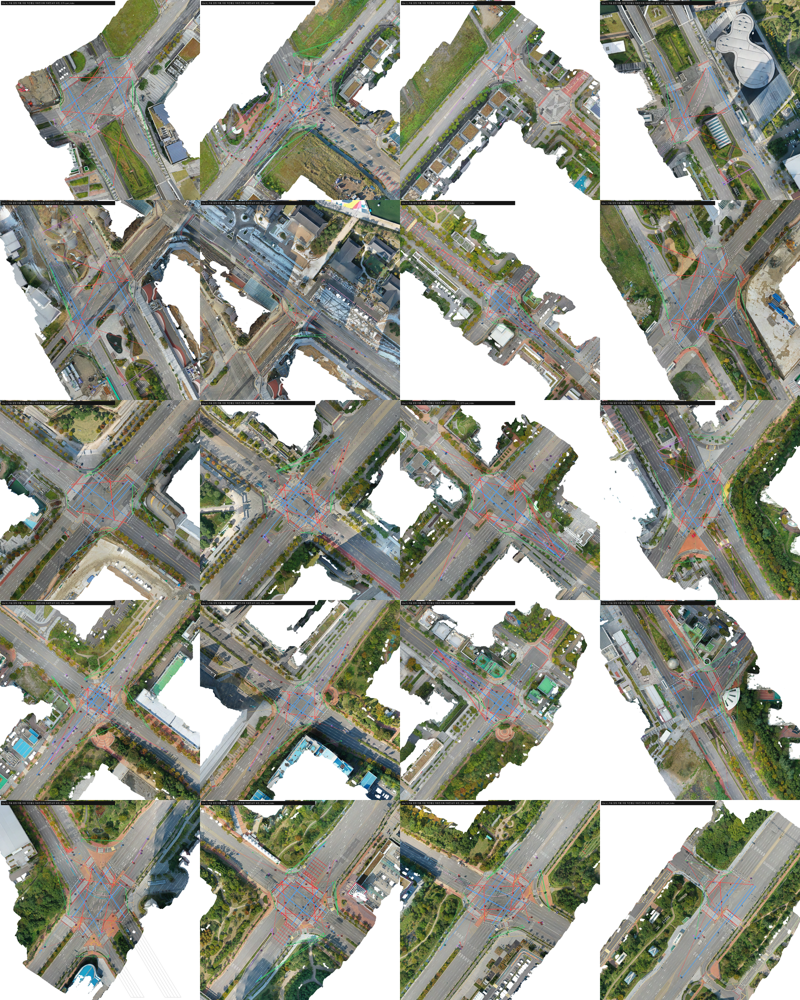

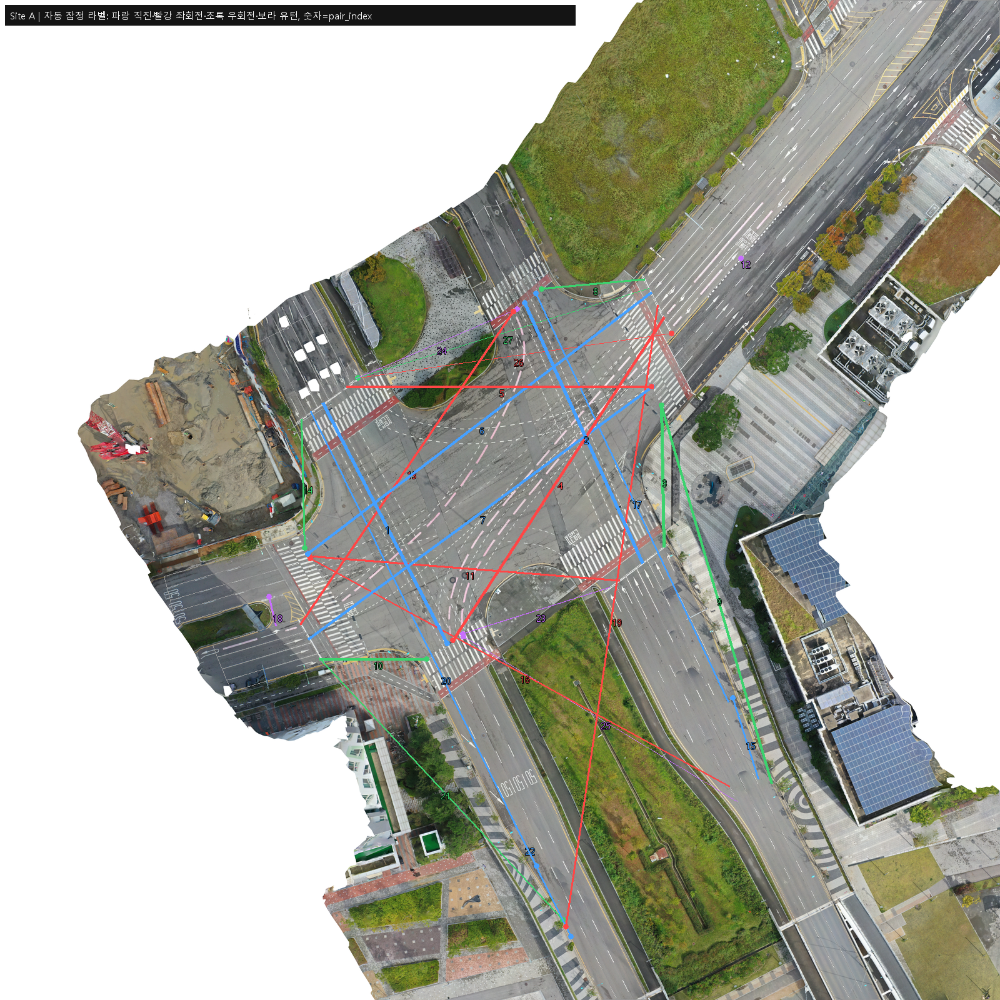

지점별 지도: C:\Users\123\Documents\(송도) 교통 연구 논문\data\processed\songdo_structure\20260922T182837Z_4eaba3c7\maps


In [10]:
COLORS = {"직진": (70, 160, 255), "좌회전": (255, 70, 70), "우회전": (60, 210, 110), "유턴": (200, 110, 255)}
font_path = Path("C:/Windows/Fonts/malgun.ttf")
font = ImageFont.truetype(str(font_path), 15) if font_path.is_file() else ImageFont.load_default()


def draw_registry_map(site):
    image_path = RAW / "orthophotos/orthophotos" / (site + ".png")
    with Image.open(image_path) as original:
        if original.size != (8000, 8000):
            raise ValueError("정사영상 크기가 8000×8000이 아닙니다: " + site)
        canvas = original.convert("RGB").resize((1600, 1600), Image.Resampling.LANCZOS)
    drawing = ImageDraw.Draw(canvas)
    for row in map_index.loc[map_index["site"].eq(site)].to_dict("records"):
        values = np.array([pd.to_numeric(row[c], errors="coerce") for pair in CORNERS for c in pair], dtype=float)
        if not np.all(np.isfinite(values)):
            continue
        polygon = [(float(row[x]) / 5, float(row[y]) / 5) for x, y in CORNERS]
        drawing.line(polygon + [polygon[0]], fill=(150, 150, 150), width=1)
    rows = movements.loc[movements["site"].eq(site)].sort_values("n_vehicles")
    for row in rows.to_dict("records"):
        points = np.array([row["entry_ortho_x"], row["entry_ortho_y"], row["exit_ortho_x"], row["exit_ortho_y"]], dtype=float)
        if not np.all(np.isfinite(points)):
            continue
        start = (points[0] / 5, points[1] / 5)
        end = (points[2] / 5, points[3] / 5)
        color = COLORS.get(row["auto_movement"], (255, 255, 255))
        width = 1 + int(round(math.log10(max(row["n_vehicles"], 1))))
        drawing.line([start, end], fill=color, width=width)
        drawing.ellipse((end[0] - 4, end[1] - 4, end[0] + 4, end[1] + 4), fill=color)
        drawing.text(((start[0] + end[0]) / 2, (start[1] + end[1]) / 2), str(row["pair_index"]),
                     font=font, fill=color, stroke_width=1, stroke_fill="black")
    drawing.rectangle((8, 8, 920, 40), fill=(20, 20, 20))
    drawing.text((16, 14), f"Site {site} | 자동 잠정 라벨: 파랑 직진·빨강 좌회전·초록 우회전·보라 유턴, 숫자=pair_index",
                 font=font, fill="white")
    return canvas


contact = Image.new("RGB", (1600, 2000), "white")
for index, site in enumerate(SITES):
    canvas = draw_registry_map(site)
    save_image(canvas, RUN_DIR / "maps" / (site + "_registry.png"))
    contact.paste(canvas.resize((400, 400), Image.Resampling.LANCZOS), ((index % 4) * 400, (index // 4) * 400))
save_image(contact, RUN_DIR / "maps" / "all_20_sites_registry.png")
display(contact)
MAP_SITE = "A"  # 크게 볼 지점
display(draw_registry_map(MAP_SITE))
print("지점별 지도:", RUN_DIR / "maps")

## 11. 저장하고 05로
05 노트북의 `SOURCE04_ID`에 아래 실행 ID를 넣고 이어서 실행합니다. 이 결과로 상충유형·위험도·상충 건수를 판단하지 않습니다.

In [11]:
run_metadata.update(status="completed" if len(completed) == 800 else "incomplete",
                    finished_at_utc=now_utc(), registry_movement_rows=len(movements),
                    registry_lane_rows=len(lanes), registry_section_rows=len(section_phase),
                    registry_link_rows=len(section_links))
save_json(run_metadata, RUN_DIR / "run_metadata.json")
print(json.dumps({
    "실행_ID(05의 SOURCE04_ID)": RUN_ID, "상태": run_metadata["status"],
    "완료파일": int(len(completed)), "전체파일": 800,
    "차량요약수": int(len(vehicles_all)), "구역쌍등록행": int(len(movements)),
    "차로등록행": int(len(lanes)), "구역역할행": int(len(section_phase)),
    "좌표계방향": sorted(set(handed["hand_local_frame"])), "결과폴더": str(RUN_DIR),
    "사후점검": ["관측 간격 분포", "좌표계 방향 일관성", "등록표·지도의 자동 라벨"],
    "아직하지않은것": "차량쌍·사건 구성, TTC/PET, EVT",
}, ensure_ascii=False, indent=2))
print("노트북을 저장하세요.")

{
  "실행_ID(05의 SOURCE04_ID)": "20260922T182837Z_4eaba3c7",
  "상태": "completed",
  "완료파일": 800,
  "전체파일": 800,
  "차량요약수": 688726,
  "구역쌍등록행": 907,
  "차로등록행": 878,
  "구역역할행": 301,
  "좌표계방향": [
    "right_handed"
  ],
  "결과폴더": "C:\\Users\\123\\Documents\\(송도) 교통 연구 논문\\data\\processed\\songdo_structure\\20260922T182837Z_4eaba3c7",
  "사후점검": [
    "관측 간격 분포",
    "좌표계 방향 일관성",
    "등록표·지도의 자동 라벨"
  ],
  "아직하지않은것": "차량쌍·사건 구성, TTC/PET, EVT"
}
노트북을 저장하세요.
